## Initial setup
This analysis using ema is based on the work of Enayat A. Moallemi created on 22 May 2018 at the Fraunhofer ISI, Karlsruhe. In that instance, the analysis was done for the MATISSE model.
This notebook present a first stage on a SA and UA. It is a screening process using the Elementary Effects Test (EET). For this, The EMA workbench is used with SAlib Morris sampler.


In [1]:

'''
Based on Enayat A. Moallemi version from May 2018

edited by Angela M. Rojas A. <angelara@student.unimelb.edu.au>

Created on 18 December 2019

'''
import sys
import os

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\EMAworkbench')

sys.path.append(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments')

#from ema_workbench.analysis.plotting_util import BOXPLOT, KDE, VIOLIN
from ema_workbench.analysis.plotting import envelopes
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import seaborn as sns
from ema_workbench.analysis import prim
#import pareto
import os
import glob
import numpy as np
import pandas as pd
import os
import glob



C:\Users\angel\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
C:\Users\angel\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


## Load the results
These results are a tuple of one data frame with the changes on each input variable, and a dictionary with the outputs. 

In [2]:
from ema_workbench import load_results

results = load_results(r'C:\Users\angel\Documents\GitHub\gr4sp\experiments\simulationData\gr4sp_2020-Jul-03.tar.gz')


In [3]:
experiments, outcomes = results

# Create a temporary copy of dictionary, with Outcomes Year
outcomesYear = dict(outcomes)

keysToRemove = [] 
# Iterate over the temporary dictionary and delete corresponding key from original dictionary
for (key, value) in outcomesYear.items() :
    if 'Month' in key:
        keysToRemove.append(key)
        
for k in keysToRemove:        
    del outcomesYear[k]   
    
        

In [8]:
experiments.describe()

,annualCpi,annualInflation,capacityFactorChangeBattery,capacityFactorChangeBrownCoal,capacityFactorChangeCcgt,capacityFactorChangeOcgt,capacityFactorChangeWater,capacityFactorChangeWind,generationRolloutPeriod,generatorRetirement,...,priceChangePercentageBattery,priceChangePercentageBrownCoal,priceChangePercentageCcgt,priceChangePercentageOcgt,priceChangePercentageWater,priceChangePercentageWind,scheduleMinCapMarketGen,semiScheduleMinCapMarketGen,technologicalImprovement,wholesaleTariffContribution
count,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,...,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000,3100.000000
mean,0.030095,0.030859,-1.060968,0.730645,0.474516,-0.062581,0.496774,0.199677,5.040645,-0.040645,...,2.690000,-1.704839,-0.547742,3.245806,0.444516,-0.362581,19.665806,15.516826,0.056148,28.125161
std,0.013757,0.013407,6.825759,7.149040,6.982137,7.148764,6.892316,7.016953,3.669330,3.765937,...,21.857905,20.503795,21.568684,20.527213,19.525721,20.825218,7.200574,10.312505,0.033572,11.963608
min,0.010000,0.010000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,-10.000000,0.000000,-5.000000,...,-30.000000,-30.000000,-30.000000,-30.000000,-30.000000,-30.000000,10.000000,0.100000,0.000000,11.000000
25%,0.018000,0.018000,-6.000000,-6.000000,-6.000000,-6.000000,-6.000000,-6.000000,2.000000,-3.000000,...,-18.000000,-18.000000,-18.000000,-18.000000,-18.000000,-18.000000,14.000000,6.080000,0.020000,17.000000
50%,0.026000,0.034000,-2.000000,2.000000,2.000000,-2.000000,2.000000,-2.000000,4.000000,1.000000,...,6.000000,-6.000000,-6.000000,6.000000,-6.000000,-6.000000,22.000000,18.040000,0.060000,31.000000
75%,0.042000,0.042000,2.000000,6.000000,6.000000,6.000000,6.000000,6.000000,8.000000,3.000000,...,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,26.000000,24.020000,0.080000,38.000000
max,0.050000,0.050000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,6.000000,...,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,30.000000,0.100000,45.000000


In [10]:
#outcomes Options: wholesalePriceYear, GHGYear, tariffsYear, primarySpotProductionYear,
# secondarySpotProductionYear, offSpotProductionYear, rooftopPvProductionYear
# numActorsYear
outcomes_to_show = ['GHGYear','wholesalePriceYear', 'tariffsYear','primarySpotProductionYear', 'secondarySpotProductionYear', 
                    'offSpotProductionYear', 'rooftopPVProductionYear' ]

uncertainties = experiments.columns[:-3]
#levers = ['rooftopPV', 'solarUptake']

#from startYear
startYear = 1998
startYearShift = (startYear - 1998)
#startYearShift = (startYear - 1997) * 12
time = outcomes['TIMEYear'][0, startYearShift:]
#index = pd.to_datetime(time, format = '%Y-%m-%d')
index = pd.to_datetime(time, format = '%Y')

for u in uncertainties:
    var = experiments[u]
    val = np.unique(var)
    print("{}: {}".format(u,val))

annualCpi: [0.01  0.018 0.026 0.034 0.042 0.05 ]
annualInflation: [0.01  0.018 0.026 0.034 0.042 0.05 ]
capacityFactorChangeBattery: [-10.  -6.  -2.   2.   6.  11.]
capacityFactorChangeBrownCoal: [-10.  -6.  -2.   2.   6.  11.]
capacityFactorChangeCcgt: [-10.  -6.  -2.   2.   6.  11.]
capacityFactorChangeOcgt: [-10.  -6.  -2.   2.   6.  11.]
capacityFactorChangeWater: [-10.  -6.  -2.   2.   6.  11.]
capacityFactorChangeWind: [-10.  -6.  -2.   2.   6.  11.]
consumption: ['Central' 'Fast change' 'High DER' 'Slow change' 'Step change']
energyEfficiency: ['Central' 'Slow change' 'Step change']
generationRolloutPeriod: [ 0.  2.  4.  6.  8. 11.]
generatorRetirement: [-5. -3. -1.  1.  3.  6.]
includePublicallyAnnouncedGen: [0. 1. 2.]
learningCurve: [0.   0.01 0.02 0.03 0.04 0.05]
nonScheduleGenSpotMarket: ['none' 'primary' 'secondary']
nonScheduleMinCapMarketGen: [ 0.1   3.08  6.06  9.04 12.02 15.  ]
onsiteGeneration: ['Central' 'Fast change' 'High DER' 'Slow change' 'Step change']
priceChang

## EET
To obtain the SALib results for each input

In [11]:
from gr4spModelEET import getModel
from ema_workbench.em_framework.salib_samplers import get_SALib_problem
from ema_workbench.em_framework.samplers import determine_parameters
from EMAworkbench.ema_workbench import (IntegerParameter, RealParameter, CategoricalParameter, BooleanParameter)

model = getModel()
UncertaintiesCategories = determine_parameters(model, 'uncertainties', union=False) 
problem = get_SALib_problem(UncertaintiesCategories)

# Build input values as floats used for each lever/uncertainty to generate outcomes. Recover them from experiments variable
X = None
for u in uncertainties:
    col_cat = None
    # map category to an index
    if isinstance(model.uncertainties[u], CategoricalParameter):
        col_cat = [ float(model.uncertainties[u].index_for_cat(cat)) for cat in experiments[u] ]
    else:
        col_cat = [ float(cat) for cat in experiments[u] ]
    
    # Concatenate each lever/uncertainty
    if X is None:
        X=col_cat
    else:
        X = np.column_stack((X,col_cat))



## Analysis of EET
The analyse method from SALib helps in the identification of the key sensitivity measures: mu, mu*, and sigma

GHGYear
wholesalePriceYear
tariffsYear
primarySpotProductionYear
secondarySpotProductionYear
offSpotProductionYear
rooftopPVProductionYear


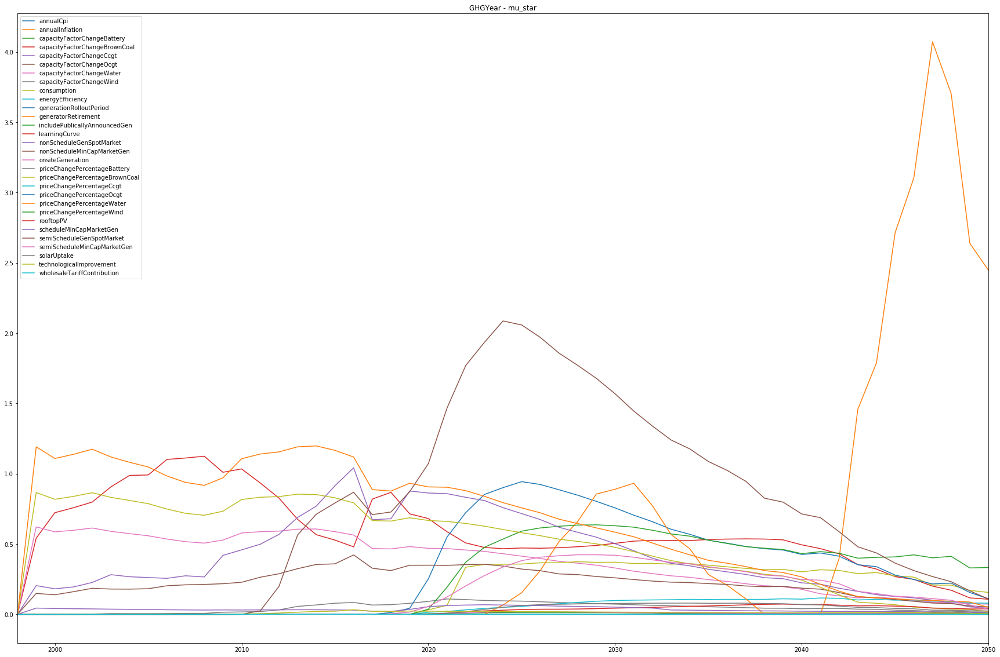

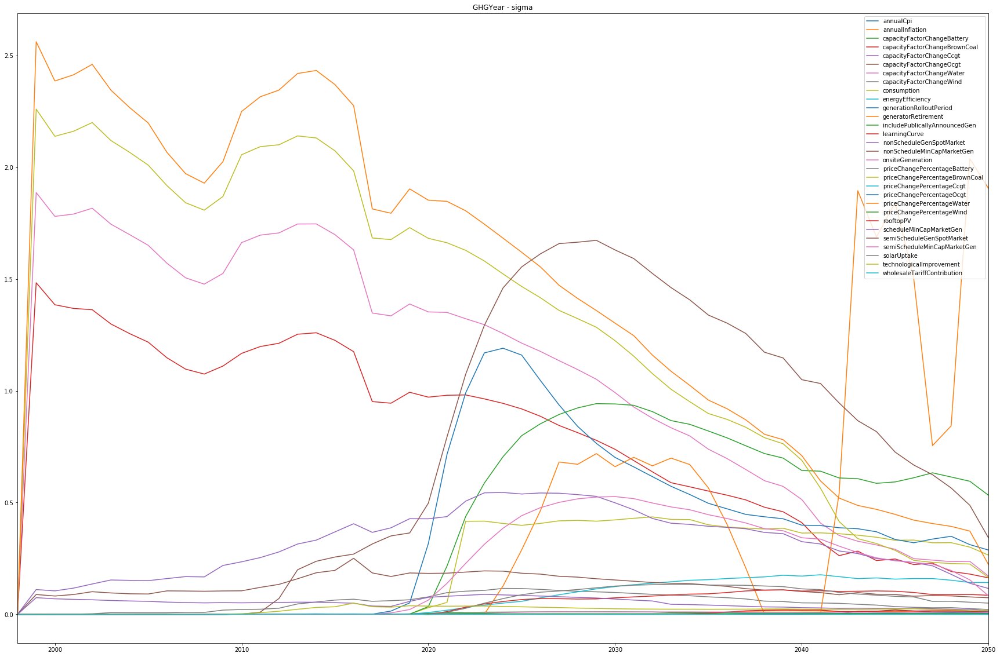

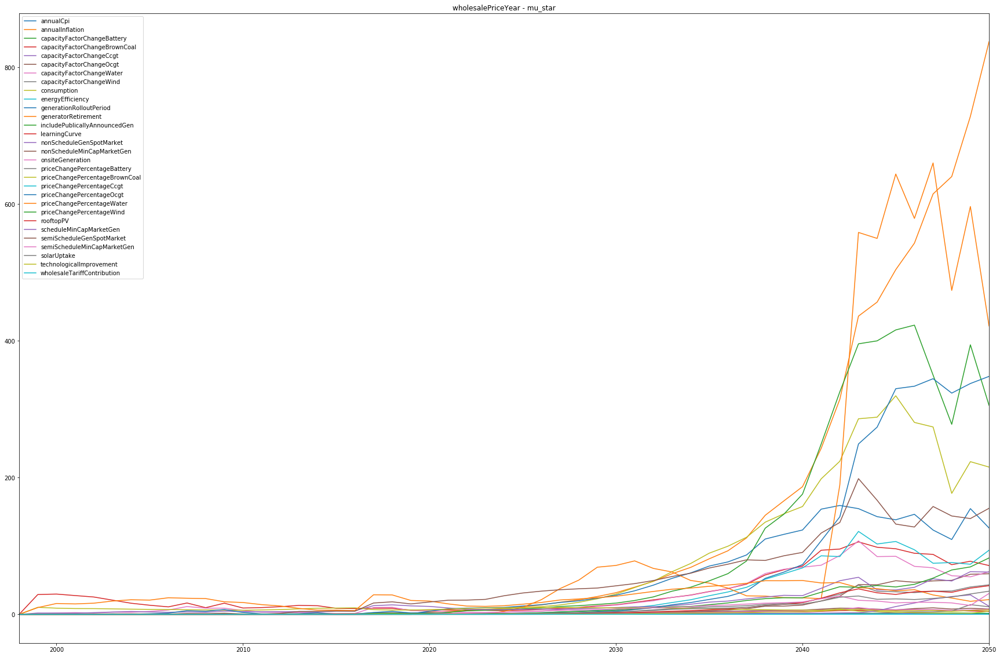

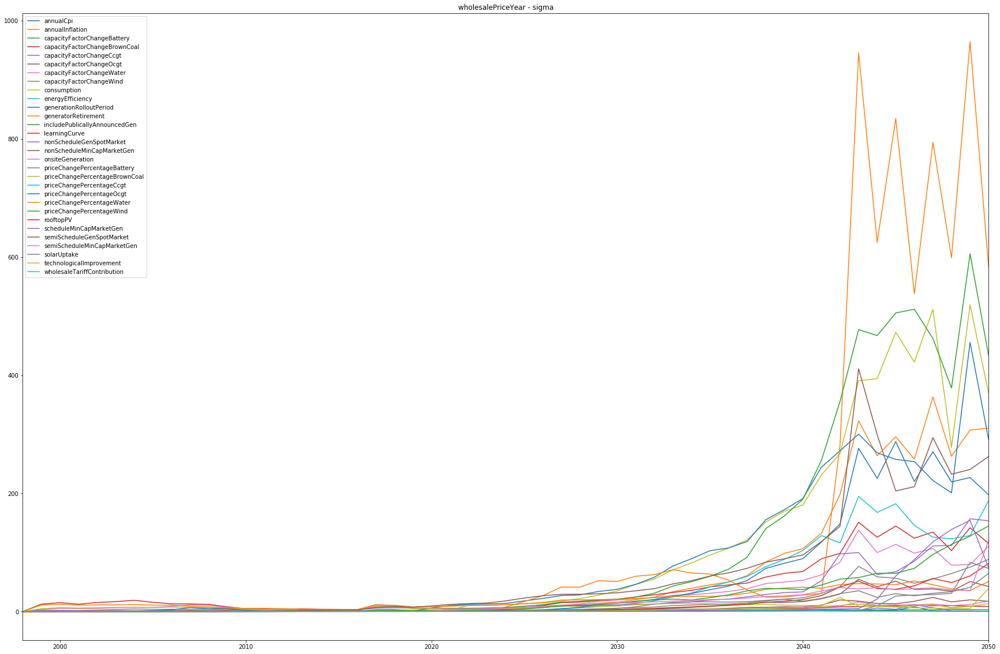

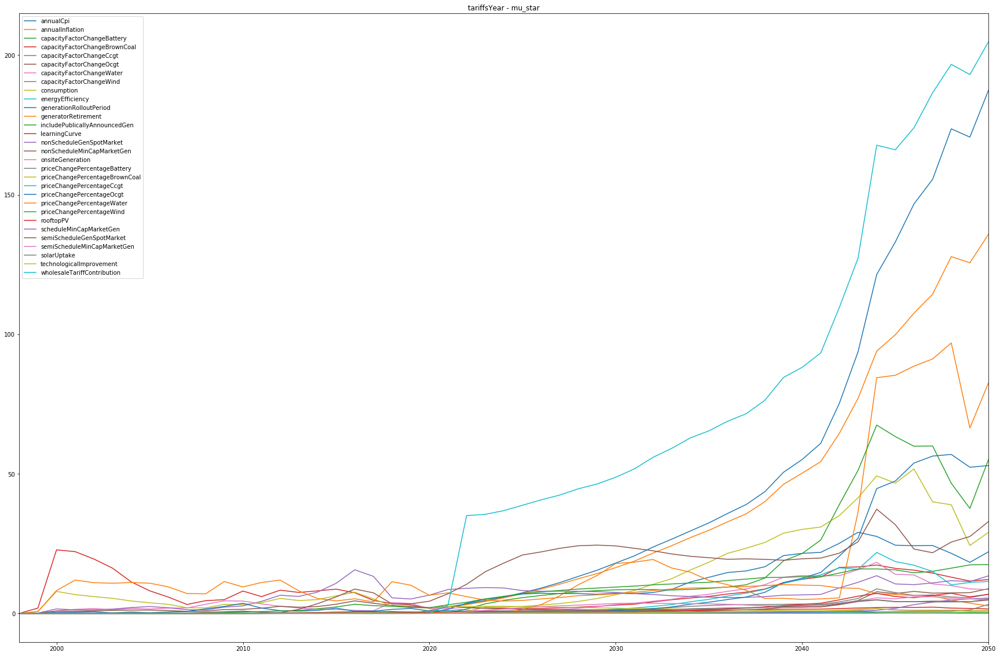

...

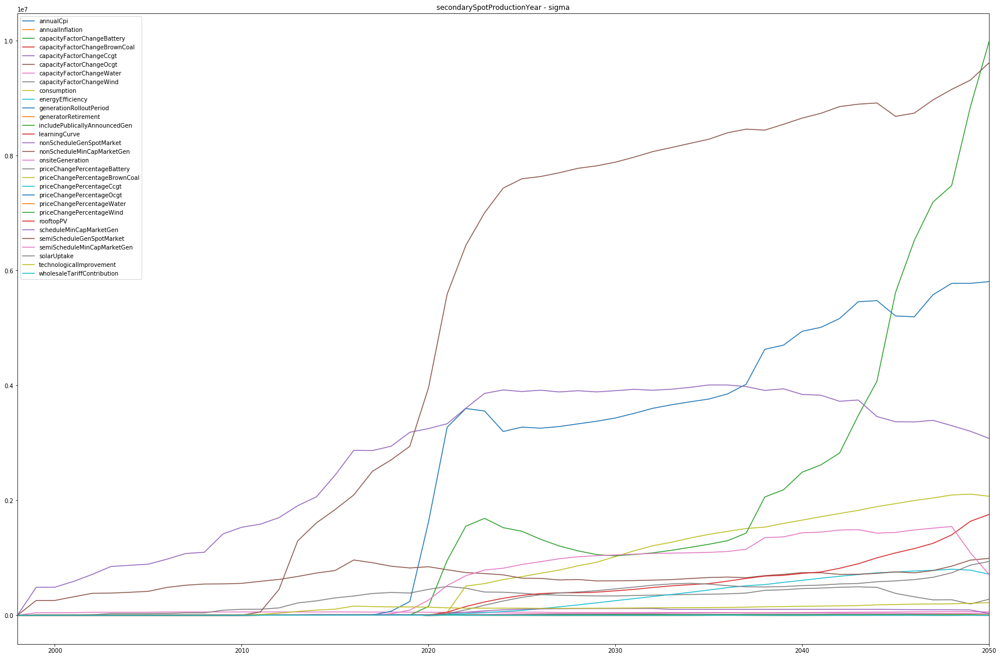

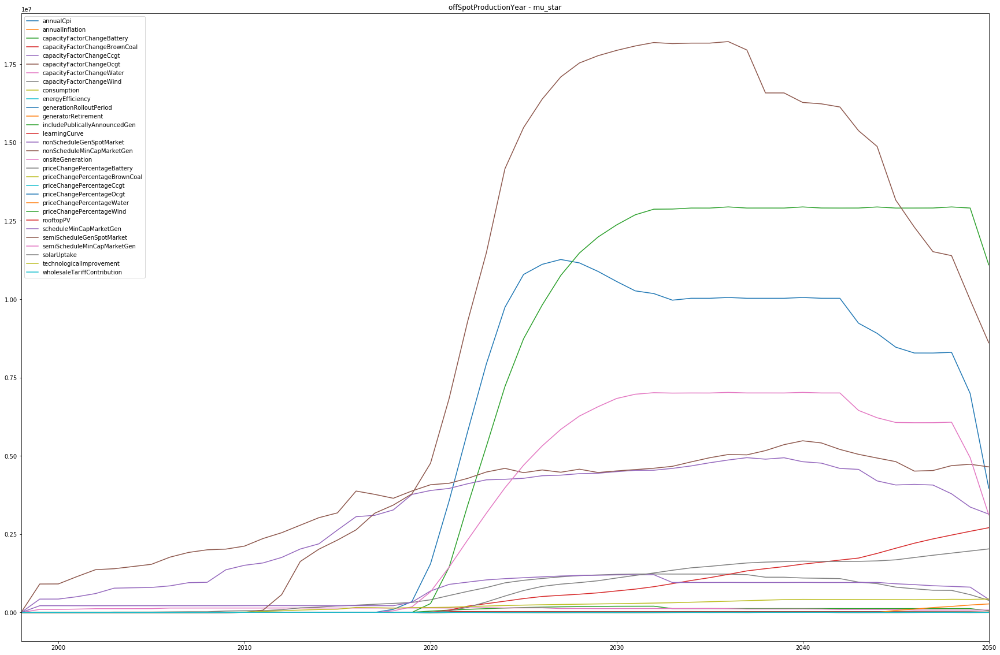

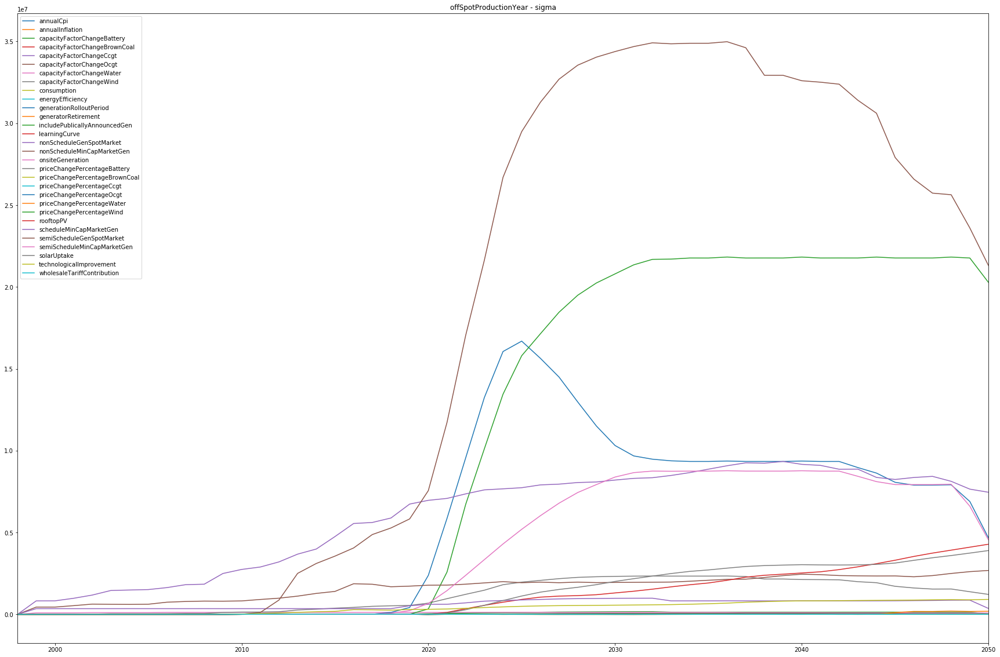

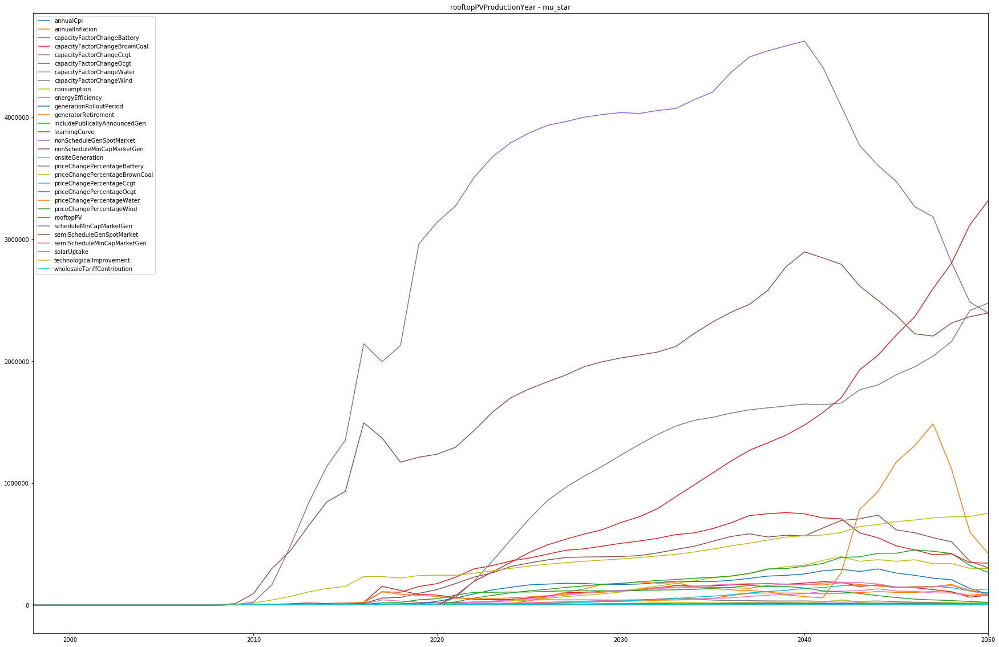

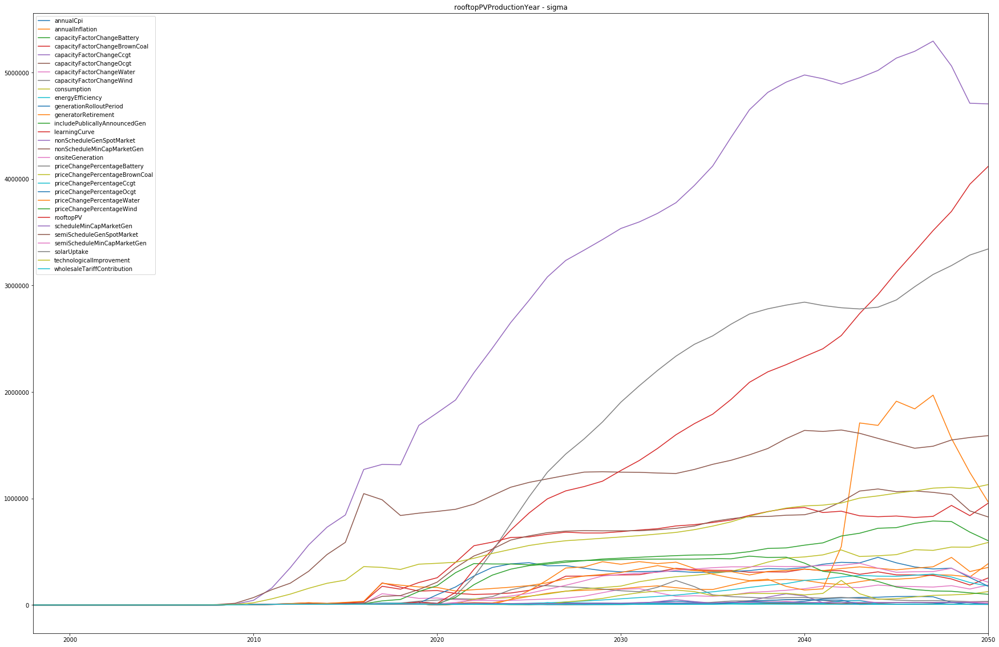

In [12]:
from SALib.analyze import morris

sigma_years_ooi = {}
mu_star_years_ooi = {}
for ooi in outcomes_to_show:
    mu_star_years = pd.DataFrame([],columns=uncertainties)
    sigma_years = pd.DataFrame([],columns=uncertainties)
    for t in range(startYearShift, startYearShift + len(time)):
        dataY = outcomes[ooi][:, t]
        #change num_levels = p to do the analysis with p levels
        Si = morris.analyze(problem, X, dataY, num_levels=6)
        
        morris_stats = {key: Si[key] for key in ['mu', 'mu_star', 'sigma',
                                                           'mu_star_conf']}
        morris_stats = pd.DataFrame(morris_stats, index=uncertainties)
        
        mu_star = pd.DataFrame([morris_stats['mu_star']],columns=uncertainties)                    
        mu_star_years = mu_star_years.append(mu_star)
        
        sigma = pd.DataFrame([Si['sigma']], columns=uncertainties)
        sigma_years = sigma_years.append(sigma)
    
    mu_star_years = mu_star_years.set_index(time)
    sigma_years = sigma_years.set_index(time)
    
    mu_star_years_ooi[ooi] = mu_star_years
    sigma_years_ooi[ooi] = sigma_years
    print(ooi)
    
    # Figure showing timeseries of mu* and sigma for each output and lever
    plt_mu_star_years = mu_star_years.plot.line(title=ooi+' - mu_star', figsize=(30, 20))
    plt_sigma_years = sigma_years.plot.line(title=ooi + ' - sigma', figsize=(30, 20))

    plt_mu_star_years.get_figure().savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_mu_star_years_%s'%(ooi)), 
                     dpi=300, bbox_inches='tight')
    plt_sigma_years.get_figure().savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_sigma_years_%s'%(ooi)), 
                     dpi=300, bbox_inches='tight')    




In [13]:
import matplotlib.ticker as ticker


for ooi in outcomes_to_show:
    mu_star_years = mu_star_years_ooi[ooi]
    for t in range(startYearShift, startYearShift + len(time)):            
        mu_star = pd.DataFrame([mu_star_years.iloc[t]],columns=uncertainties).T  
        mu_star.columns = ['mu_star']
        mu_star = mu_star.sort_values(by='mu_star', ascending=False)
        # mu_star['num_index'] = np.arange(len(problem['names']))
        year = mu_star_years.index[t]
        print(ooi + ' - year ' + str(year))
        print(mu_star[:5])
        
        

        # f = plt.figure(figsize=(30,20))    
        # chart = sns.barplot(
        #     data=mu_star,
        #     x=mu_star.index,
        #     y='mu_star'
        # 
        # )
        # xlabels = chart.get_xticklabels()        
        # chart.set_xticklabels(xlabels, rotation=90)
        # f.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\figs', '_mu_star_year_%d_%s'%(year,ooi)), 
        #                     dpi=300, bbox_inches='tight')
        # 
        # f.clear()
        # plt.close(f)

GHGYear - year 1998
                             mu_star
annualCpi                        0.0
annualInflation                  0.0
technologicalImprovement         0.0
solarUptake                      0.0
semiScheduleMinCapMarketGen      0.0
GHGYear - year 1999
                                 mu_star
priceChangePercentageWater      1.191213
priceChangePercentageBrownCoal  0.866314
capacityFactorChangeWater       0.622258
capacityFactorChangeBrownCoal   0.541765
nonScheduleGenSpotMarket        0.204272
GHGYear - year 2000
                                 mu_star
priceChangePercentageWater      1.108845
priceChangePercentageBrownCoal  0.818363
capacityFactorChangeBrownCoal   0.723092
capacityFactorChangeWater       0.586775
nonScheduleGenSpotMarket        0.181595
GHGYear - year 2001
                                 mu_star
priceChangePercentageWater      1.138321
priceChangePercentageBrownCoal  0.839182
capacityFactorChangeBrownCoal   0.758603
capacityFactorChangeWater       0.598047
n

includePublicallyAnnouncedGen  0.634921
GHGYear - year 2029
                                mu_star
semiScheduleGenSpotMarket      1.678240
generatorRetirement            0.855705
generationRolloutPeriod        0.803560
includePublicallyAnnouncedGen  0.636625
priceChangePercentageWater     0.614857
GHGYear - year 2030
                                mu_star
semiScheduleGenSpotMarket      1.568997
generatorRetirement            0.889751
generationRolloutPeriod        0.757192
includePublicallyAnnouncedGen  0.630190
priceChangePercentageWater     0.584401
GHGYear - year 2031
                                mu_star
semiScheduleGenSpotMarket      1.446114
generatorRetirement            0.932281
generationRolloutPeriod        0.705585
includePublicallyAnnouncedGen  0.620157
priceChangePercentageWater     0.552243
GHGYear - year 2032
                                mu_star
semiScheduleGenSpotMarket      1.339464
generatorRetirement            0.772838
generationRolloutPeriod        0.659274


wholesalePriceYear - year 2027
                              mu_star
generatorRetirement         37.668327
semiScheduleGenSpotMarket   36.013370
priceChangePercentageWater  21.020672
annualInflation             17.699195
generationRolloutPeriod     17.384752
wholesalePriceYear - year 2028
                              mu_star
generatorRetirement         49.991709
semiScheduleGenSpotMarket   37.391637
priceChangePercentageWater  22.491227
annualInflation             21.254389
generationRolloutPeriod     19.779564
wholesalePriceYear - year 2029
                              mu_star
generatorRetirement         68.963186
semiScheduleGenSpotMarket   38.488966
annualInflation             26.097784
priceChangePercentageWater  24.276524
generationRolloutPeriod     23.653715
wholesalePriceYear - year 2030
                             mu_star
generatorRetirement        71.541180
semiScheduleGenSpotMarket  41.713544
annualInflation            31.684639
consumption                29.581383
generat

tariffsYear - year 2023
                               mu_star
wholesaleTariffContribution  35.486421
semiScheduleGenSpotMarket    14.926966
nonScheduleGenSpotMarket      9.272959
priceChangePercentageWind     5.218599
generationRolloutPeriod       5.030985
tariffsYear - year 2024
                               mu_star
wholesaleTariffContribution  36.833048
semiScheduleGenSpotMarket    18.047986
nonScheduleGenSpotMarket      9.100824
priceChangePercentageWind     6.122470
generationRolloutPeriod       6.039472
tariffsYear - year 2025
                               mu_star
wholesaleTariffContribution  38.753471
semiScheduleGenSpotMarket    20.927101
nonScheduleGenSpotMarket      8.177568
annualCpi                     7.396989
priceChangePercentageWind     7.139314
tariffsYear - year 2026
                               mu_star
wholesaleTariffContribution  40.676924
semiScheduleGenSpotMarket    22.039744
annualCpi                     9.099847
annualInflation               8.733367
nonSche

primarySpotProductionYear - year 2021
                                    mu_star
semiScheduleGenSpotMarket      1.036466e+07
nonScheduleGenSpotMarket       6.801386e+06
generationRolloutPeriod        3.390461e+06
nonScheduleMinCapMarketGen     1.322729e+06
includePublicallyAnnouncedGen  1.229578e+06
primarySpotProductionYear - year 2022
                                    mu_star
semiScheduleGenSpotMarket      1.239715e+07
nonScheduleGenSpotMarket       6.452632e+06
generationRolloutPeriod        4.381208e+06
consumption                    2.752321e+06
includePublicallyAnnouncedGen  2.472736e+06
primarySpotProductionYear - year 2023
                                    mu_star
semiScheduleGenSpotMarket      1.392810e+07
nonScheduleGenSpotMarket       6.271697e+06
generationRolloutPeriod        5.138009e+06
includePublicallyAnnouncedGen  3.286895e+06
consumption                    2.938534e+06
primarySpotProductionYear - year 2024
                                    mu_star
semiSchedule

secondarySpotProductionYear - year 2018
                                 mu_star
nonScheduleGenSpotMarket    4.812810e+06
semiScheduleGenSpotMarket   4.069303e+06
nonScheduleMinCapMarketGen  5.603008e+05
capacityFactorChangeWind    3.839688e+05
technologicalImprovement    6.523130e+04
secondarySpotProductionYear - year 2019
                                 mu_star
nonScheduleGenSpotMarket    5.237664e+06
semiScheduleGenSpotMarket   4.381581e+06
nonScheduleMinCapMarketGen  5.446663e+05
capacityFactorChangeWind    3.803292e+05
generationRolloutPeriod     1.144933e+05
secondarySpotProductionYear - year 2020
                                 mu_star
semiScheduleGenSpotMarket   5.470044e+06
nonScheduleGenSpotMarket    5.299668e+06
generationRolloutPeriod     9.114460e+05
nonScheduleMinCapMarketGen  5.612193e+05
capacityFactorChangeWind    4.321180e+05
secondarySpotProductionYear - year 2021
                                    mu_star
semiScheduleGenSpotMarket      7.046672e+06
nonScheduleGen

offSpotProductionYear - year 2015
                                 mu_star
nonScheduleMinCapMarketGen  3.179407e+06
nonScheduleGenSpotMarket    2.631978e+06
semiScheduleGenSpotMarket   2.311321e+06
scheduleMinCapMarketGen     2.172300e+05
capacityFactorChangeWind    2.097375e+05
offSpotProductionYear - year 2016
                                 mu_star
nonScheduleMinCapMarketGen  3.875350e+06
nonScheduleGenSpotMarket    3.057836e+06
semiScheduleGenSpotMarket   2.636979e+06
capacityFactorChangeWind    2.338974e+05
scheduleMinCapMarketGen     2.199140e+05
offSpotProductionYear - year 2017
                                 mu_star
nonScheduleMinCapMarketGen  3.769502e+06
semiScheduleGenSpotMarket   3.167709e+06
nonScheduleGenSpotMarket    3.099803e+06
capacityFactorChangeWind    2.625884e+05
scheduleMinCapMarketGen     2.174523e+05
offSpotProductionYear - year 2018
                                 mu_star
nonScheduleMinCapMarketGen  3.645080e+06
semiScheduleGenSpotMarket   3.427914e+06
non

learningCurve                    8116.757772
rooftopPVProductionYear - year 2013
                                     mu_star
nonScheduleGenSpotMarket       836242.253752
nonScheduleMinCapMarketGen     650972.678214
technologicalImprovement       107233.374662
capacityFactorChangeBrownCoal   17186.735817
learningCurve                   10460.306346
rooftopPVProductionYear - year 2014
                                    mu_star
nonScheduleGenSpotMarket       1.139250e+06
nonScheduleMinCapMarketGen     8.459830e+05
technologicalImprovement       1.350182e+05
capacityFactorChangeBrownCoal  1.254229e+04
priceChangePercentageWater     8.614138e+03
rooftopPVProductionYear - year 2015
                                    mu_star
nonScheduleGenSpotMarket       1.351323e+06
nonScheduleMinCapMarketGen     9.325705e+05
technologicalImprovement       1.525680e+05
capacityFactorChangeBrownCoal  1.633565e+04
priceChangePercentageWater     1.434759e+04
rooftopPVProductionYear - year 2016
             

In [14]:
#Save mu_star into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_mu_star'), engine='xlsxwriter')
for ooi in outcomes_to_show:
    mu_star_years = mu_star_years_ooi[ooi]
    mu_star_years.to_excel(writer, sheet_name=ooi)
writer.save()

#Save sigma into EXCEL
writer = pd.ExcelWriter('{}/EE_{}.xlsx'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\data', '_sigma'), engine='xlsxwriter')
for ooi in outcomes_to_show:
    sigma_years = sigma_years_ooi[ooi]
    sigma_years.to_excel(writer, sheet_name=ooi)
writer.save()

### Average mu_star and sigma all years in data frame

In [15]:
mu_star_average_ooi = {}
mu_star_max_val_ooi = {}
sigma_average_ooi = {}
sigma_max_val_ooi = {}

for ooi in outcomes_to_show:
    
    mu_star_average_ooi[ooi] = mu_star_years_ooi[ooi].mean()    
    mu_star_max_val_ooi[ooi] = mu_star_years_ooi[ooi].max()
    sigma_average_ooi[ooi] = sigma_years_ooi[ooi].mean()
    sigma_max_val_ooi[ooi] = sigma_years_ooi[ooi].max()

### Scatter plots of mu_star vs sigma 
Previous figures shown the changes of mu* and sigma over time for each lever/uncertainty and output. However, it is difficult to capture the most significant inputs, for this a mu* vs sigma plot (EET) is more
appropriate.  

GHGYear
wholesalePriceYear
tariffsYear
primarySpotProductionYear
secondarySpotProductionYear
offSpotProductionYear
rooftopPVProductionYear


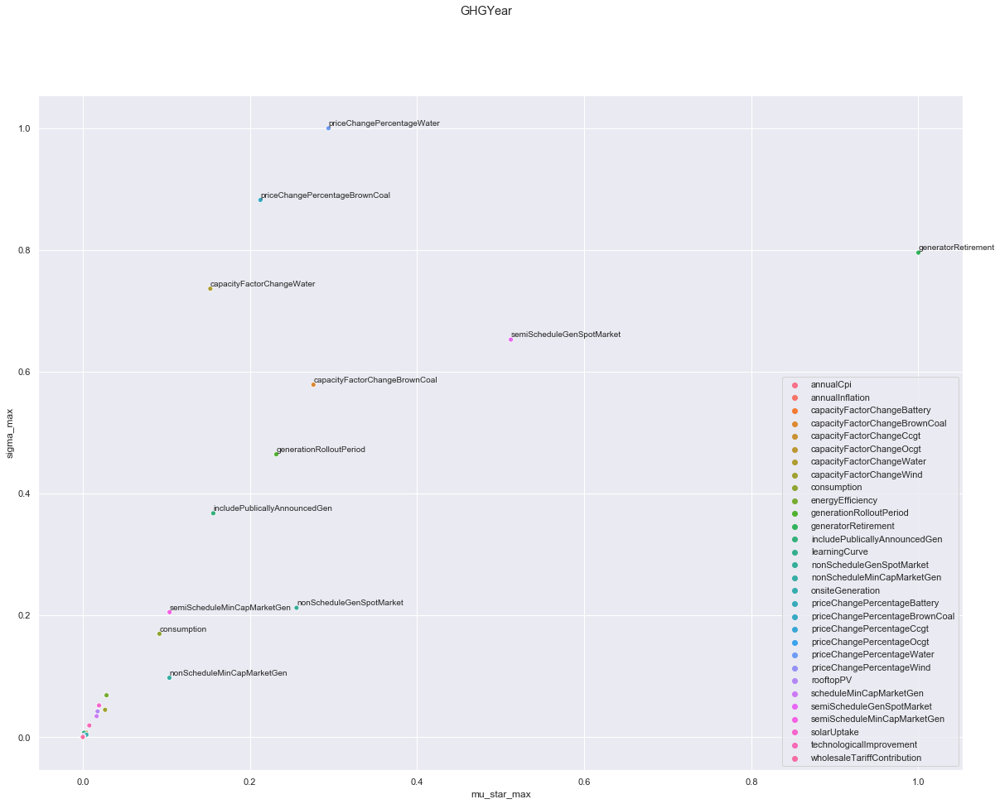

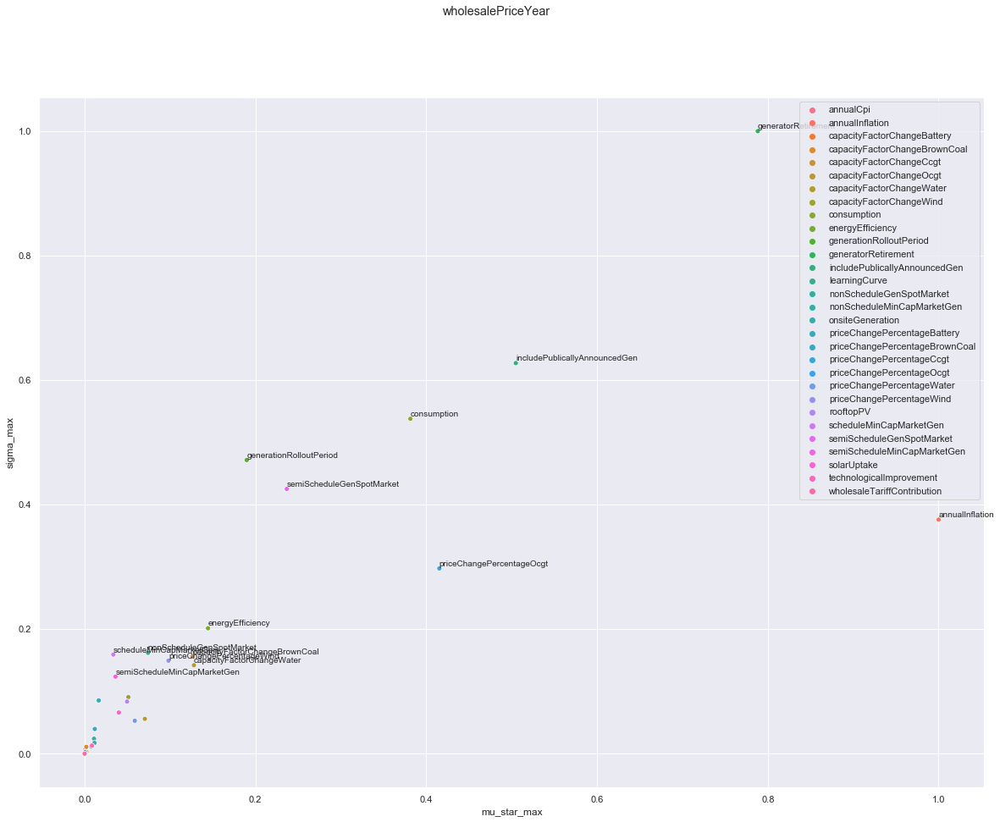

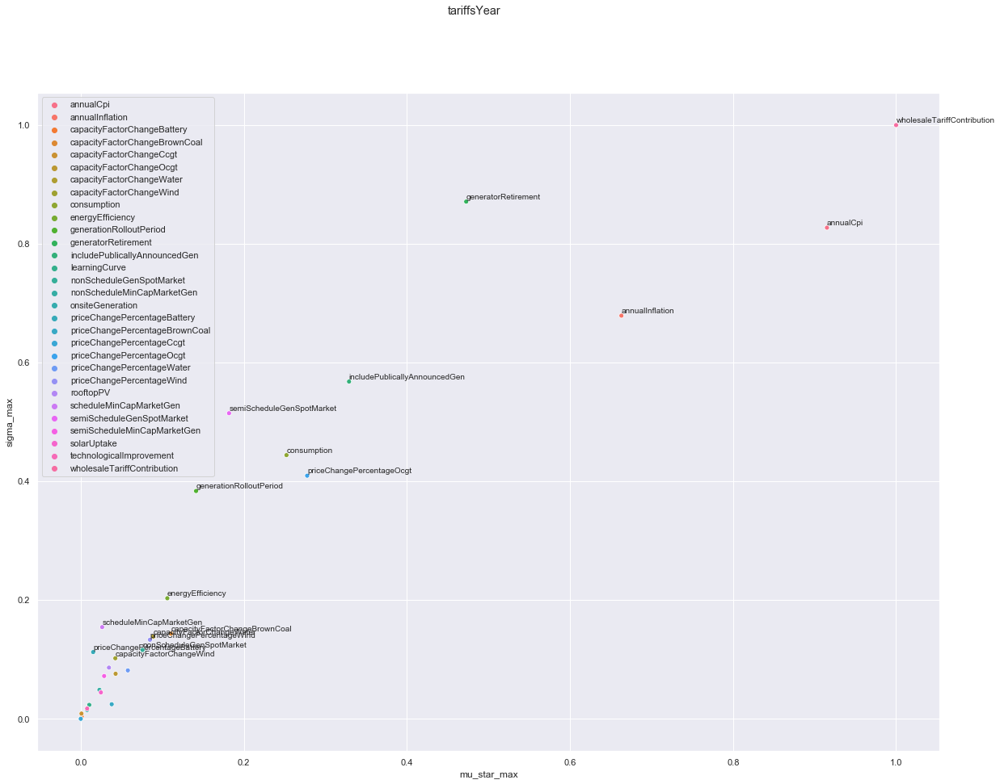

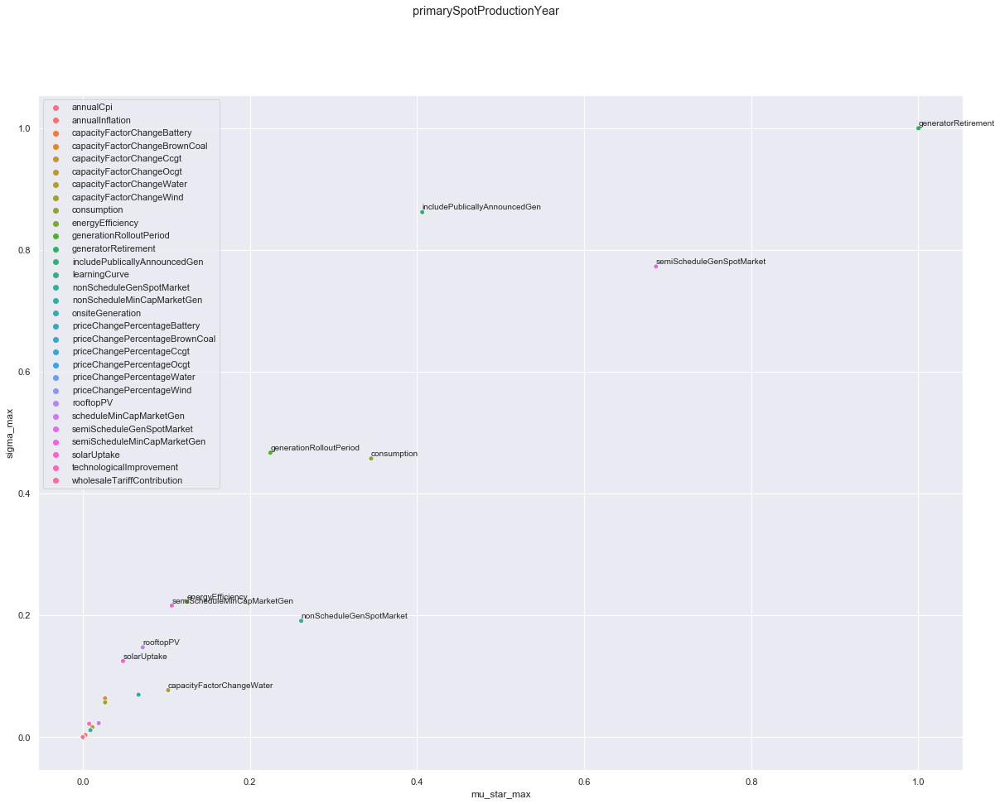

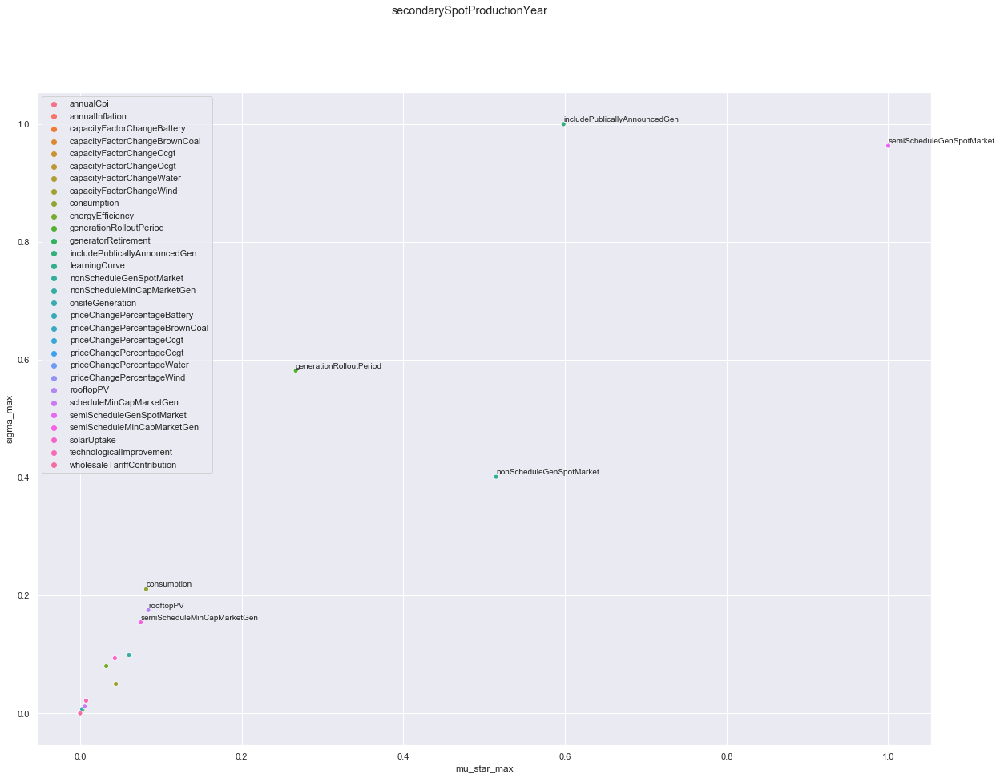

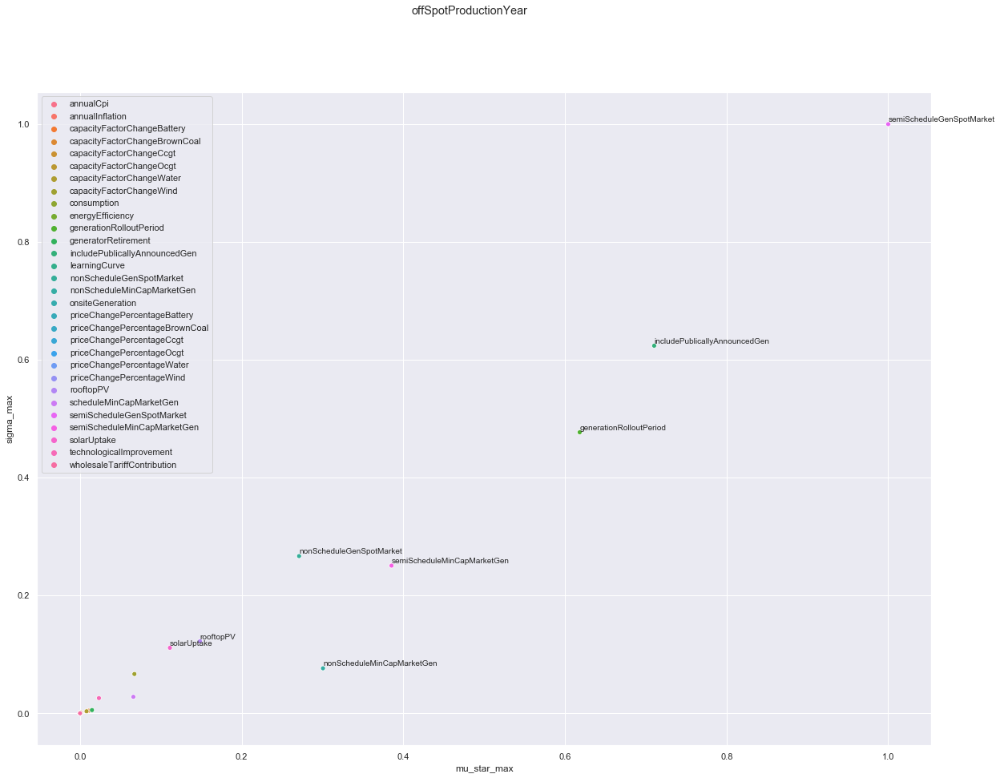

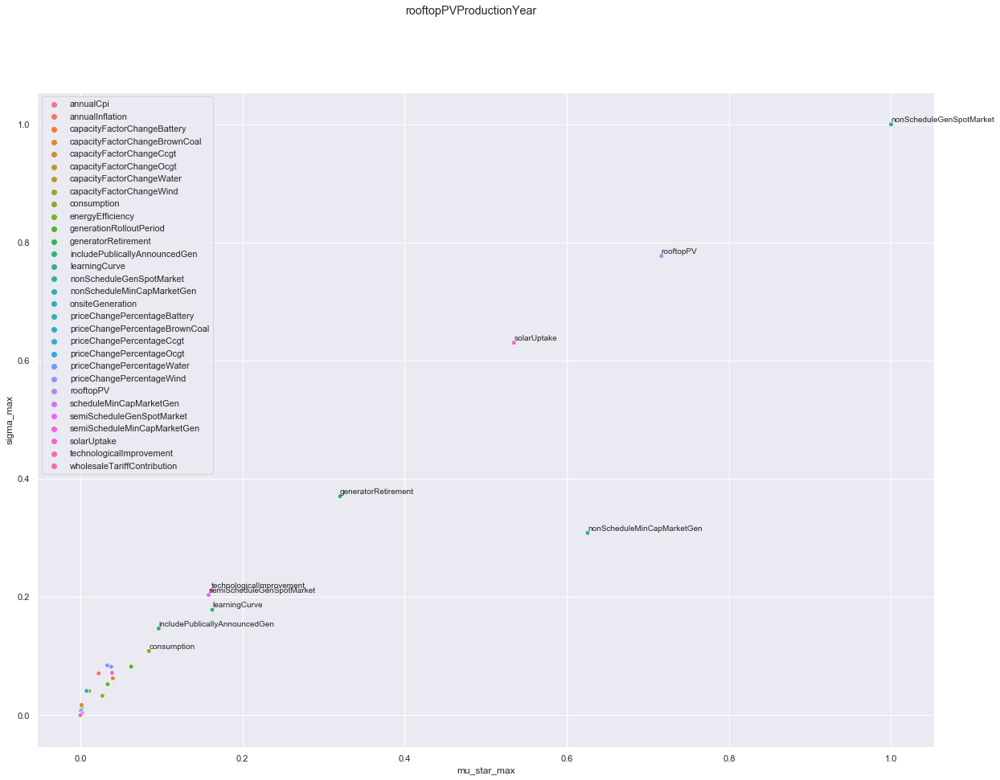

In [16]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

for ooi in outcomes_to_show:
    
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_max_val_ooi[ooi] - mu_star_max_val_ooi[ooi].min())/(mu_star_max_val_ooi[ooi].max() - mu_star_max_val_ooi[ooi].min())
    normalized_sigma = (sigma_max_val_ooi[ooi] - sigma_max_val_ooi[ooi].min())/(sigma_max_val_ooi[ooi].max() - sigma_max_val_ooi[ooi].min())
    
    df_max = pd.concat({'mu_star_max': normalized_mu_star,'sigma_max': normalized_sigma}, axis=1)
    
    f=plt.figure(figsize=(20,15))
    f.suptitle(ooi)
    
    
    sns.scatterplot(x='mu_star_max',y='sigma_max', hue=df_max.index, data=df_max)
    
    #df_max.plot.scatter(x='mu_star_max',y='sigma_max',c='DarkBlue')
    
    #Add labels above points
    for index, row in df_max.iterrows():
            if row['mu_star_max'] <= 0.1 and row['sigma_max'] <= 0.1: continue
            plt.annotate(index, # this is the text
                         (row['mu_star_max'],row['sigma_max']), # this is the point to label
                         textcoords="offset points", # how to position the text
                         xytext=(0,3), # distance from text to points (x,y)
                         ha='left', # horizontal alignment can be left, right or center
                         fontsize=10)  # font size



    print(ooi)

    plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_max_%s'%(ooi)),dpi=300, bbox_inches='tight')
    
# f.show()
# f.clear()
# plt.close(f)

### Subset significant factors
Scatter plots of mu_star vs sigma 

GHGYear - 10
['capacityFactorChangeBrownCoal' 'capacityFactorChangeWater'
 'generationRolloutPeriod' 'generatorRetirement'
 'includePublicallyAnnouncedGen' 'nonScheduleGenSpotMarket'
 'priceChangePercentageBrownCoal' 'priceChangePercentageWater'
 'semiScheduleGenSpotMarket' 'semiScheduleMinCapMarketGen']
wholesalePriceYear - 8
['annualInflation' 'consumption' 'energyEfficiency'
 'generationRolloutPeriod' 'generatorRetirement'
 'includePublicallyAnnouncedGen' 'priceChangePercentageOcgt'
 'semiScheduleGenSpotMarket']
tariffsYear - 10
['annualCpi' 'annualInflation' 'consumption' 'energyEfficiency'
 'generationRolloutPeriod' 'generatorRetirement'
 'includePublicallyAnnouncedGen' 'priceChangePercentageOcgt'
 'semiScheduleGenSpotMarket' 'wholesaleTariffContribution']
primarySpotProductionYear - 8
['consumption' 'energyEfficiency' 'generationRolloutPeriod'
 'generatorRetirement' 'includePublicallyAnnouncedGen'
 'nonScheduleGenSpotMarket' 'semiScheduleGenSpotMarket'
 'semiScheduleMinCapMarketG

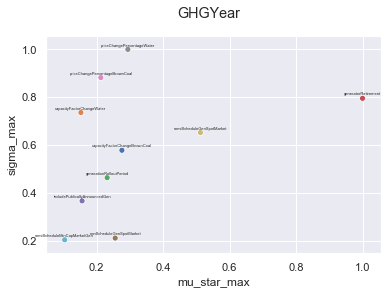

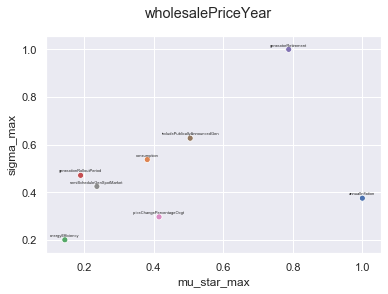

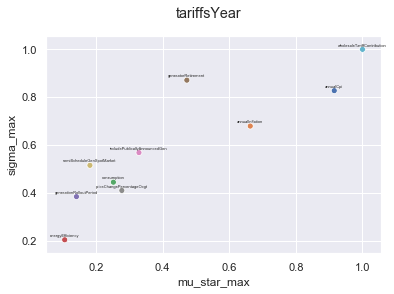

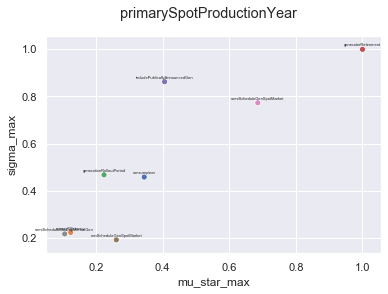

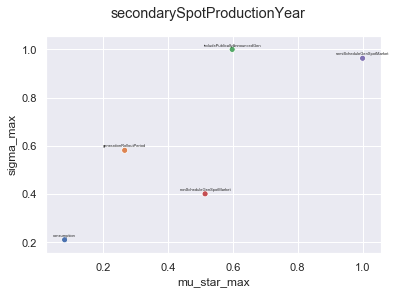

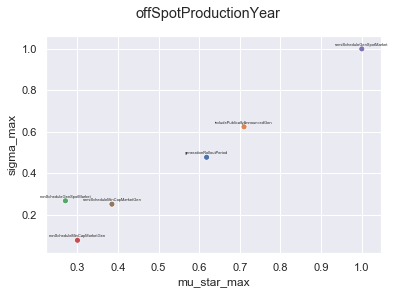

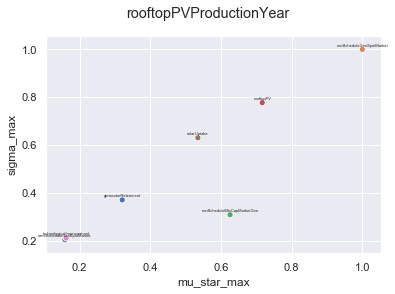

In [17]:
import seaborn as sns; sns.set()
#f = plt.figure(figsize=(20,30)) 

#bound used to filter INPUTS
significance_bound = 0.2
significant_inputs = set()
significant_inputs_filter = {}
for ooi in outcomes_to_show:
    #Normalize values so all graphs are btw 0 and 1. Otherwise cannot use text coordinates below
    normalized_mu_star = (mu_star_max_val_ooi[ooi] - mu_star_max_val_ooi[ooi].min())/(mu_star_max_val_ooi[ooi].max() - mu_star_max_val_ooi[ooi].min())
    normalized_sigma = (sigma_max_val_ooi[ooi] - sigma_max_val_ooi[ooi].min())/(sigma_max_val_ooi[ooi].max() - sigma_max_val_ooi[ooi].min())
    
    #filter values
    filter_mu_star = normalized_mu_star > significance_bound
    filter_sigma = normalized_sigma > significance_bound
    normalized_mu_star_filtered = normalized_mu_star[ filter_mu_star | filter_sigma ]
    normalized_sigma_filtered = normalized_sigma[ filter_mu_star | filter_sigma ] 
    
    #keep track significant inputs filter
    significant_inputs_filter[ooi] = normalized_mu_star_filtered.index.values
    for l in normalized_mu_star_filtered.index.values:
        significant_inputs.add(l) 
    
    #create dataframe     
    df_max = pd.concat({'mu_star_max': normalized_mu_star_filtered,'sigma_max': normalized_sigma_filtered}, axis=1)
    
    #print significant indexes per ooi
    print(ooi + ' - {}'.format(len(significant_inputs_filter[ooi])))
    print(significant_inputs_filter[ooi])
    
    #create figure
    f=plt.figure()#figsize=(30,20))
    f.suptitle(ooi)
    
    #ScatterPlot        
    #df_max.plot.scatter(x='mu_star_max',y='sigma_max',c='DarkBlue')
    sns.scatterplot(x='mu_star_max',y='sigma_max', hue=df_max.index, data=df_max, legend=False)

    
    #Add labels above points
    for index, row in df_max.iterrows():
            plt.annotate(index, # this is the text
                         (row['mu_star_max'],row['sigma_max']), # this is the point to label
                         textcoords="offset points", # how to position the text
                         xytext=(0,3), # distance from text to points (x,y)
                         ha='center', # horizontal alignment can be left, right or center
                         fontsize=4)  # font size
           
        

    plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', 'scatter_mu_star_sigmna_max_%s_filtered'%(ooi)),dpi=300, bbox_inches='tight')
# f.show()
# f.clear()
# plt.close(f)

print("ALL significant inputs (%d)"%len(significant_inputs))
print(significant_inputs)

In [18]:
normalized_mu_star.index

Index(['annualCpi', 'annualInflation', 'capacityFactorChangeBattery',
       'capacityFactorChangeBrownCoal', 'capacityFactorChangeCcgt',
       'capacityFactorChangeOcgt', 'capacityFactorChangeWater',
       'capacityFactorChangeWind', 'consumption', 'energyEfficiency',
       'generationRolloutPeriod', 'generatorRetirement',
       'includePublicallyAnnouncedGen', 'learningCurve',
       'nonScheduleGenSpotMarket', 'nonScheduleMinCapMarketGen',
       'onsiteGeneration', 'priceChangePercentageBattery',
       'priceChangePercentageBrownCoal', 'priceChangePercentageCcgt',
       'priceChangePercentageOcgt', 'priceChangePercentageWater',
       'priceChangePercentageWind', 'rooftopPV', 'scheduleMinCapMarketGen',
       'semiScheduleGenSpotMarket', 'semiScheduleMinCapMarketGen',
       'solarUptake', 'technologicalImprovement',
       'wholesaleTariffContribution'],
      dtype='object')

## Boxplot

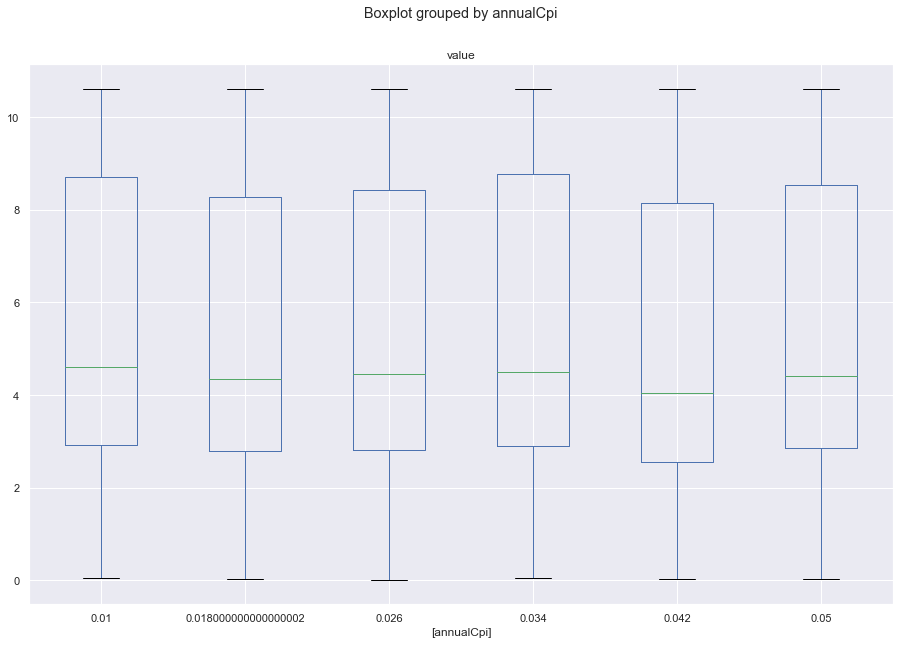

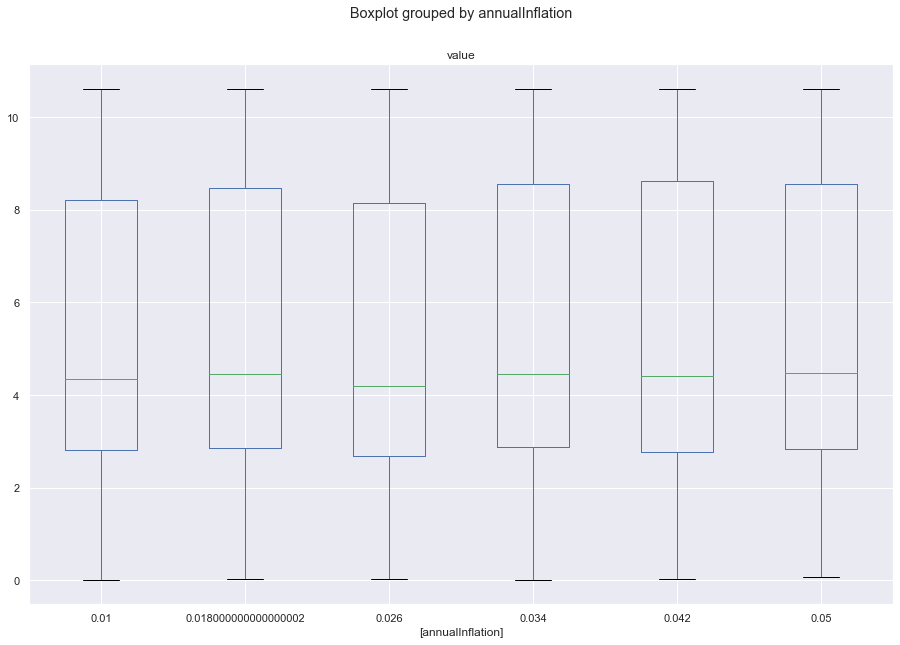

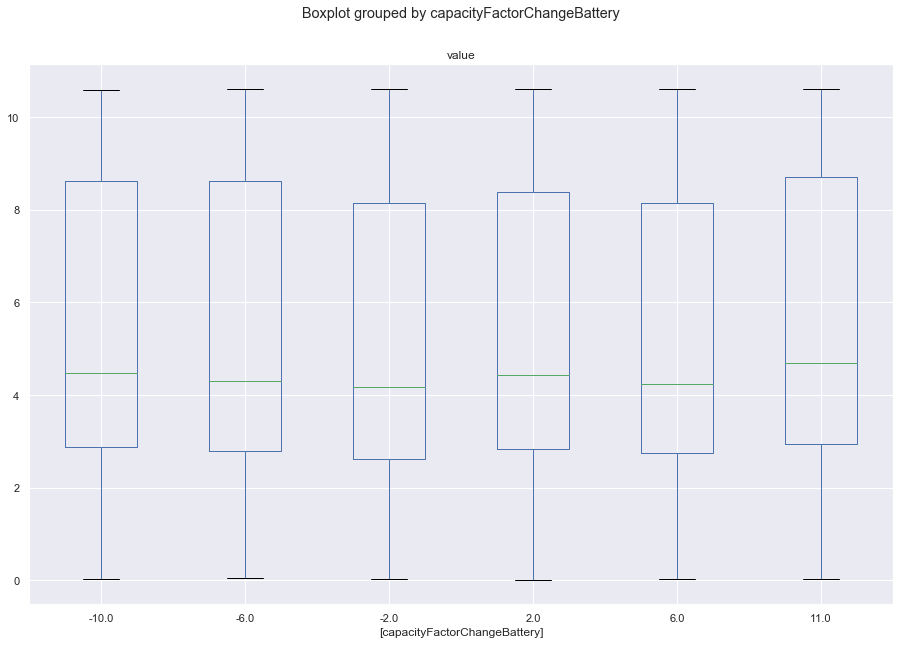

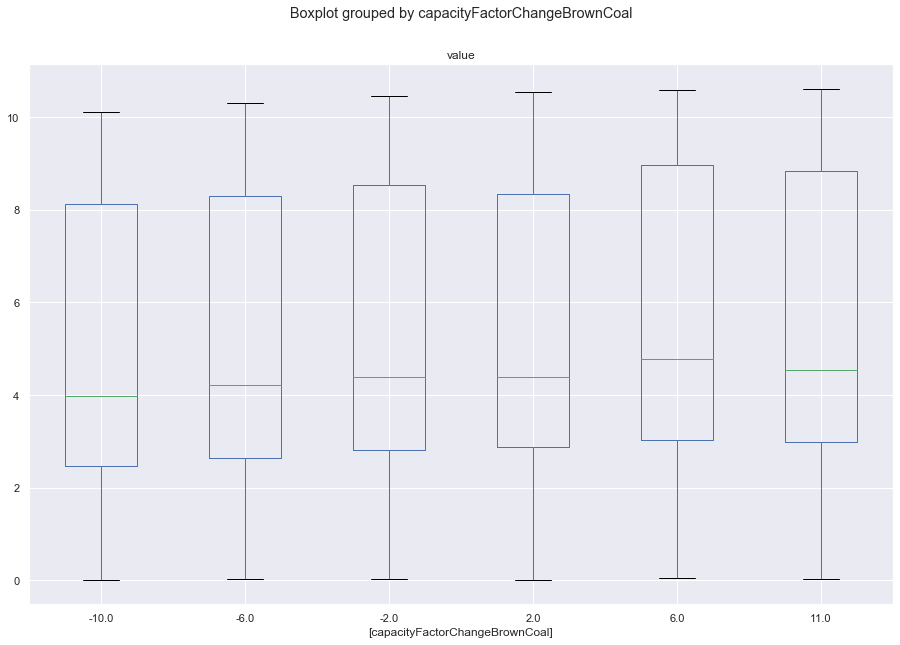

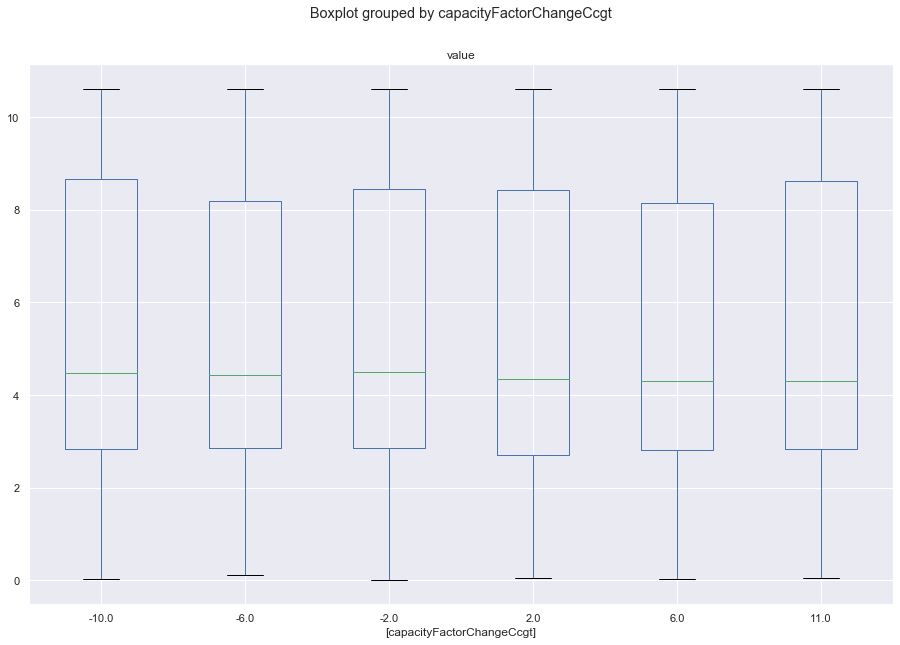

...

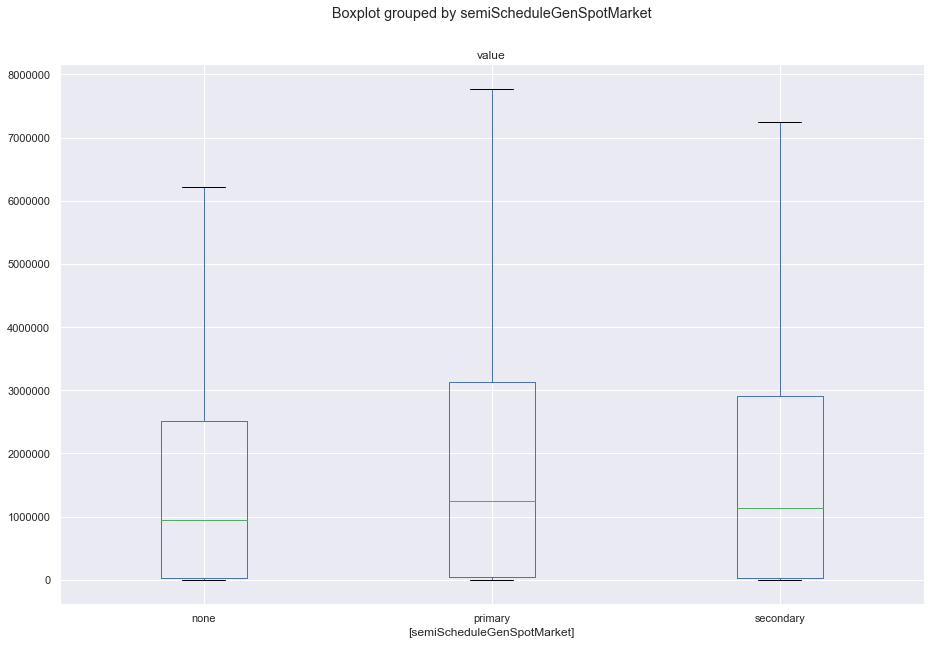

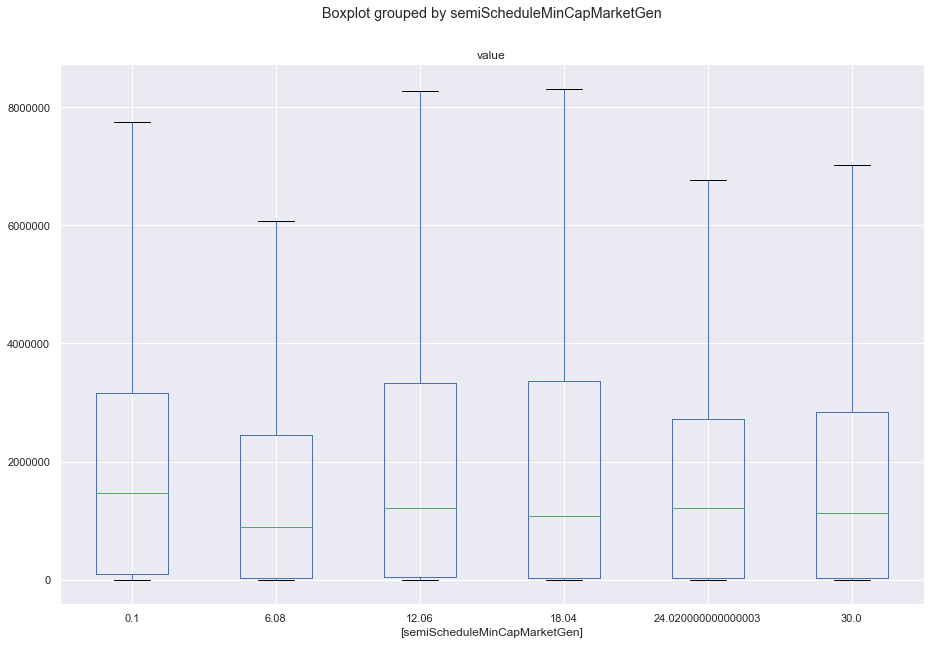

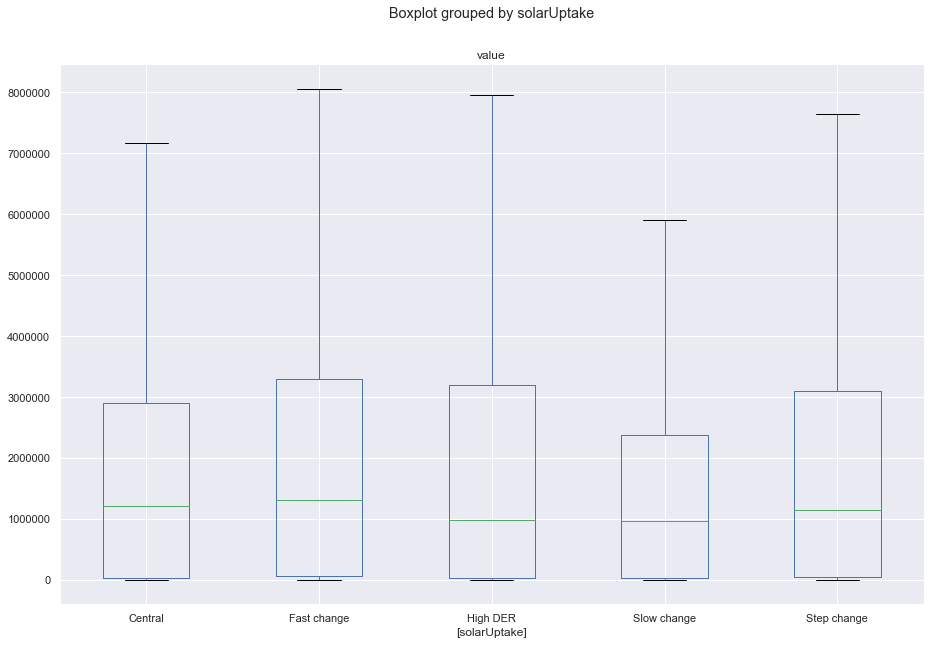

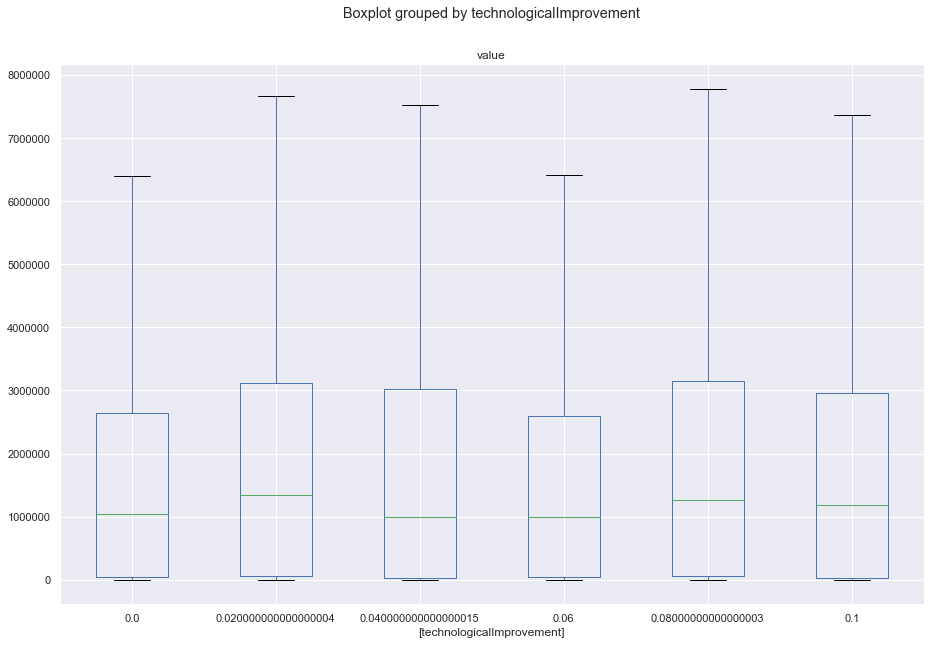

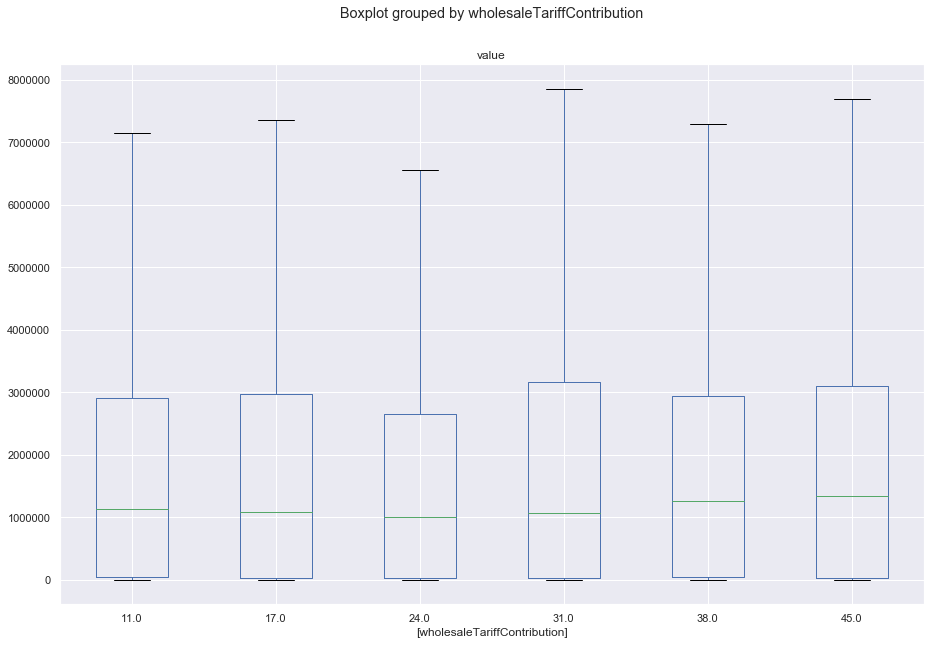

In [26]:
index = pd.to_datetime(time, format = '%Y')

for ooi in outcomes_to_show:
    data = outcomes[ooi][:, startYearShift:]
    
   
    for u in uncertainties:
        dfBoxPlot = pd.DataFrame(index = index, data = data.T,columns=[ experiments[u] ])
        dfMeltdfBoxPlot = pd.melt(dfBoxPlot)
        #dfMeltdfBoxPlot.rename(columns={"value":ooi})
    
        ax = dfMeltdfBoxPlot.boxplot(by=u, meanline=True, showmeans=False, showcaps=True, 
                        showbox=True, showfliers=False, return_type='axes', figsize=(15, 10))
        
        
        plt.savefig('{}/fig{}.png'.format(r'C:\\Users\\angel\\Documents\\GitHub\\gr4sp\\experiments\\notebookGr4sp\\outputs\\figs', '_eet_boxplots_%s_%s'%(ooi,u)), 
                     dpi=300, bbox_inches='tight')
        
       
        plt.show()
        plt.close()
